# **Regularization in Practice**

ในการเพิ่มประสิทธิภาพ Machine Learning Model มีวิธีการหลัก 2 อย่าง ที่ต้องให้ความสำคัญ คือ 1) การลด Generalization Error ด้วย Regularization และ 2) การลด Cost Value ด้วย Optimization หรือการหาค่าที่เหมาะสมที่สุด

การลด Cost Value (Optimization) มีเป้าหมายคือ การทำให้ Model เรียนรู้ หรือ จดจำ รูปแบบจากข้อมูลที่ใช้ฝึก (Training Data) ให้ได้ดีที่สุดเท่าที่จะทำได้

เราใช้อัลกอริทึมที่เรียกว่า Optimizer (เช่น Adam, SGD, RMSprop) เพื่อปรับค่าน้ำหนัก (Weights) ของ Model ไปในทิศทางที่ทำให้ค่า Cost Function (หรือ Loss Function) ต่ำที่สุด


เหมือนการเดินลงจากภูเขาเพื่อหาจุดที่ต่ำที่สุดในหุบเขา  Optimizer คือ กลยุทธ์ในการก้าวเดิน จะก้าวสั้น ก้าวยาวแค่ไหน หรือจะเดินไปทางไหน เพื่อให้ไปถึงจุดต่ำสุดได้เร็วและแม่นยำที่สุด



อย่างไรก็ตามถ้าเราทำแค่ขั้นตอนนี้อย่างเดียว Model จะเก่งกับข้อมูลที่ใช้ฝึกมาก ๆ แต่อาจจะกลายเป็น นักท่องจำ ที่ไม่สามารถประยุกต์ใช้กับโจทย์ใหม่ ๆ ได้เลย ซึ่งนำไปสู่ปัญหาที่เรียกว่า Overfitting

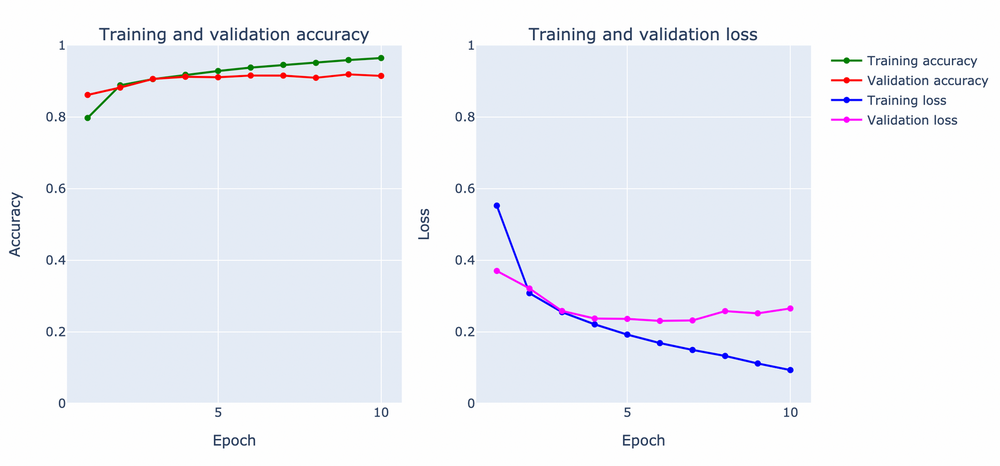

เป้าหมายของการทำ Regularization คือการทำให้ Model เข้าใจ และสามารถนำความรู้ไปประยุกต์ใช้กับข้อมูลใหม่ที่ไม่เคยเห็นมาก่อน (Unseen Data) ได้ดี

เราใช้เทคนิค Regularization เช่น Dropout, L2 Regularization Data Augmentation เพื่อจำกัดความซับซ้อนของ Model หรือเพิ่มความหลากหลายของข้อมูล

เหมือนการบังคับให้นักเรียนไม่ท่องจำคำตอบจากหนังสือเรียนเพียงอย่างเดียว แต่ต้องเข้าใจแนวคิดหลัก ๆ เพื่อที่จะทำข้อสอบที่ไม่เคยเห็นมาก่อนได้ Regularization คือ เทคนิคการสอนที่บังคับให้เกิดความเข้าใจไม่ใช่แค่การท่องจำซึ่งจะทำให้ Model ไม่เกิด Overfitting

ดังนั้น Optimization และ Optimization คือสองแกนหลักที่ต้องให้ความสำคัญและปรับจูนไปพร้อม ๆ กันเพื่อสร้าง Model ที่มีประสิทธิภาพสูงสุด

ถ้า Optimization มากไป Model จะเกิด Overfitting (ทำข้อสอบเก่าได้เกือบ 100% แต่สอบตกในสนามจริง)

ถ้า Regularization มากไป Model จะเกิด Underfitting (เรียนแบบไม่ใส่ใจ จำอะไรก็ไม่ได้เลย ทำให้สอบตกทั้งข้อสอบเก่าและสนามจริง)



> เพิ่มข้อความทั้งย่อหน้าที่ยกมา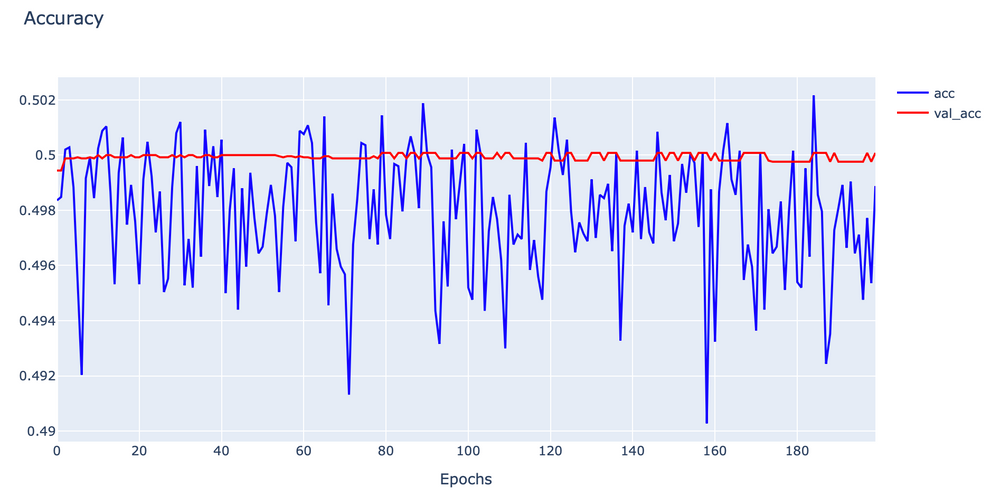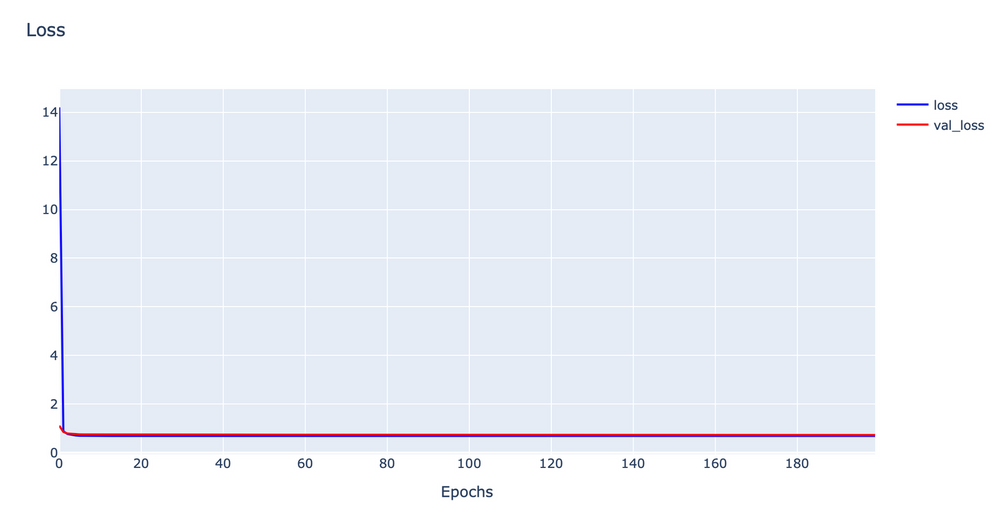




บทความนี้เราจะทดลองแก้ปัญหา Overfitting ของ Neural Network แบบ Classification Model ที่มีการ Train ด้วย CIFAR-10 Dataset โดยยกตัวอย่างเทคนิคที่เป็นที่นิยมในปัจจุบัน 3 เทคนิค ได้แก่การทำ Augmentation, Dropout, Label Smoothing, Mixup & CutMix ซึ่งในที่สุดแล้วจะทำให้สามารถเพิ่มประสิทธิภาพของ Model ได้มากน้อยเท่าไหร่ สามารถติดตามอ่านกันได้ครับ

# **CIFAR-10 Dataset**

CIFAR-10 เป็น Dataset ที่เป็นภาพวัตถุและสัตว์ต่าง ๆ ขนาด 32x32 Pixel แบบสี (RGB) แบ่งเป็นข้อมูล Train 50,000 ภาพ และข้อมูล Test อีก 10,000 ภาพ รวมทั้งหมด 10 ประเภท โดยมีการกำหนด Label ตั้งแต่ 0-9 ดังนี้


0: airplane (เครื่องบิน)

1: automobile (รถยนต์)

2: bird (นก)

3: cat (แมว)
4: deer (กวาง)

5: dog (สุนัข)

6: frog (กบ)

7: horse (ม้า)

8: ship (เรือ)

9: truck (รถบรรทุก)


ซึ่งเราจะต้องมีการ Load Dataset, ทำ Scaling ข้อมูล ระหว่าง 0-1, เข้ารหัสผลเฉลยแบบ One-hot Encoding, และ Split Dataset สำหรับการ Train และ Validation ดังต่อไปนี้

**Import Library และกำหนดค่า Parameter ที่จำเป็น**

In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import numpy as np

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.model_selection import train_test_split

In [2]:
IMG_ROWS = 28
IMG_COLS = 28
NUM_CLASSES = 10
VAL_SIZE = 0.2
RANDOM_STATE = 99
BATCH_SIZE = 100

**Load Dataset**

In [3]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


## **ทำ Scaling ข้อมูล ระหว่าง 0-1**

In [4]:
# แปลงชนิดข้อมูลเป็น float32 เพื่อให้รองรับค่าทศนิยม
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# ทำ Scaling โดยการหารด้วย 255
x_train /= 255.0
x_test /= 255.0

**เข้ารหัสผลเฉลยแบบ One-hot Encoding**

In [5]:
y_train = tf.keras.utils.to_categorical(y_train, NUM_CLASSES)
y_test = tf.keras.utils.to_categorical(y_test, NUM_CLASSES)

y_train[0]

array([0., 0., 0., 0., 0., 0., 1., 0., 0., 0.])

**Split Dataset สำหรับการ Train และ Validation**

In [6]:
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=VAL_SIZE, random_state=RANDOM_STATE)

**ตรวจสอบขนาดของข้อมูลแต่ละชุด**

In [7]:
print(f"x_train shape {x_train.shape}")
print(f"y_train shape {y_train.shape}")
print(f"x_val shape {x_val.shape}")
print(f"y_val shape {y_val.shape}")
print(f"x_test shape {x_test.shape}")
print(f"y_test shape {y_test.shape}")

x_train shape (40000, 32, 32, 3)
y_train shape (40000, 10)
x_val shape (10000, 32, 32, 3)
y_val shape (10000, 10)
x_test shape (10000, 32, 32, 3)
y_test shape (10000, 10)


**Plot ข้อมูล Train Dataset**

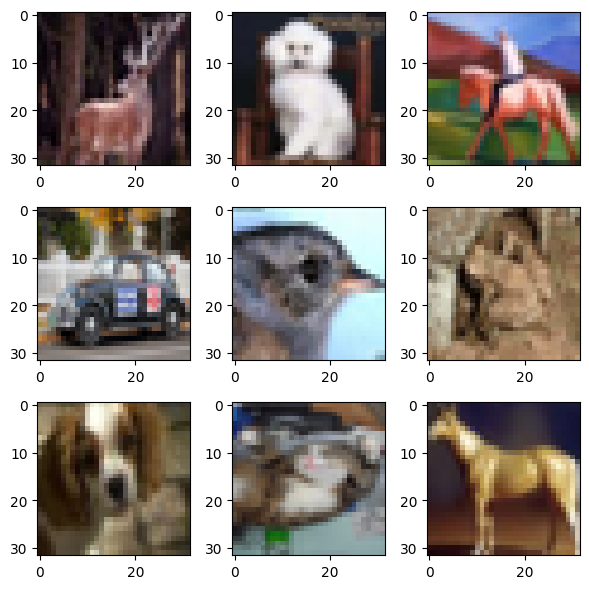

In [8]:
# กำหนดขนาดรูปภาพ
plt.figure(figsize=(6, 6))

for i in range(9):
    # สร้าง subplot ในตารางขนาด 3x3 ตำแหน่งที่ i+1
    plt.subplot(3, 3, i + 1)

    # แสดงรูปภาพ
    plt.imshow(x_train[i])

plt.tight_layout() # จัด layout ให้สวยงามอัตโนมัติ
plt.show()

## **Baseline Model**

นิยาม Model, Compile Model และ Train Model โดยยังไม่ใช้เทคนิค Regularization ดังต่อไปนี้



> นิยาม Model



In [9]:
input_shape=(32, 32, 3)
inputs = Input(shape=input_shape)

# Feature Extraction Layers
x = layers.Conv2D(32, (3, 3), activation='relu')(inputs)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)

# Classification Layers
x = layers.Flatten()(x)
x = layers.Dense(64, activation='relu')(x)

# กำหนด Output Layer
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

# ประกาศว่าโมเดลนี้มีจุดเริ่มต้น (inputs) และจุดสิ้นสุด (outputs)
model = models.Model(inputs=inputs, outputs=outputs)



> Compile Model




In [10]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)



>Train Model



In [11]:
EPOCHS = 20

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.3198 - loss: 1.8557 - val_accuracy: 0.5004 - val_loss: 1.3937
Epoch 2/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5243 - loss: 1.3411 - val_accuracy: 0.5669 - val_loss: 1.2450
Epoch 3/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5753 - loss: 1.2032 - val_accuracy: 0.5857 - val_loss: 1.1900
Epoch 4/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6188 - loss: 1.0929 - val_accuracy: 0.6350 - val_loss: 1.0681
Epoch 5/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6510 - loss: 1.0016 - val_accuracy: 0.6494 - val_loss: 1.0063
Epoch 6/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.6707 - loss: 0.9454 - val_accuracy: 0.6652 - val_loss: 0.9773
Epoch 7/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6935 - loss: 0.8848 - val_accuracy: 0.6735 - val_loss: 0.9609
Epoch 8/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7107 - loss: 0.8420 - val_accuracy: 0.



> Plot กราฟ



In [12]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

จากกราฟ Loss ด้านบน พบว่า Model เริ่มมีปัญหา Overfitting

# **Image Augmentation**

ปัญหา Overfitting ของ Model สามารถแก้ได้ด้วยการเพิ่มจำนวน Data ในการ Train แต่ด้วย Dataset ของเรามีจำกัด ดังนั้นในบางกรณีเราจึงต้องสังเคราะห์ Data ขึ้นมาเอง ในกรณีของ Data แบบ Image เราสามารถใช้เทคนิคอย่างเช่นการหมุนภาพ การเลื่อนภาพ และการกลับภาพ ฯลฯ ซึ่งนอกจากเป็นการขยายจำนวน Data แล้ว Image Augmentation ยังช่วยเพิ่มความหลากหลายของภาพที่จะนำไป Train อีกด้วย

แต่ก่อนอื่นเราจะอ่านไฟล์ภาพน้องเหมียวตังค์ฟูล มาทดลองทำ Image Augmentation ตามขั้นตอน ดังนี้



> อ่านไฟล์ภาพน้องตังค์ฟูล และ Plot ภาพน้อง



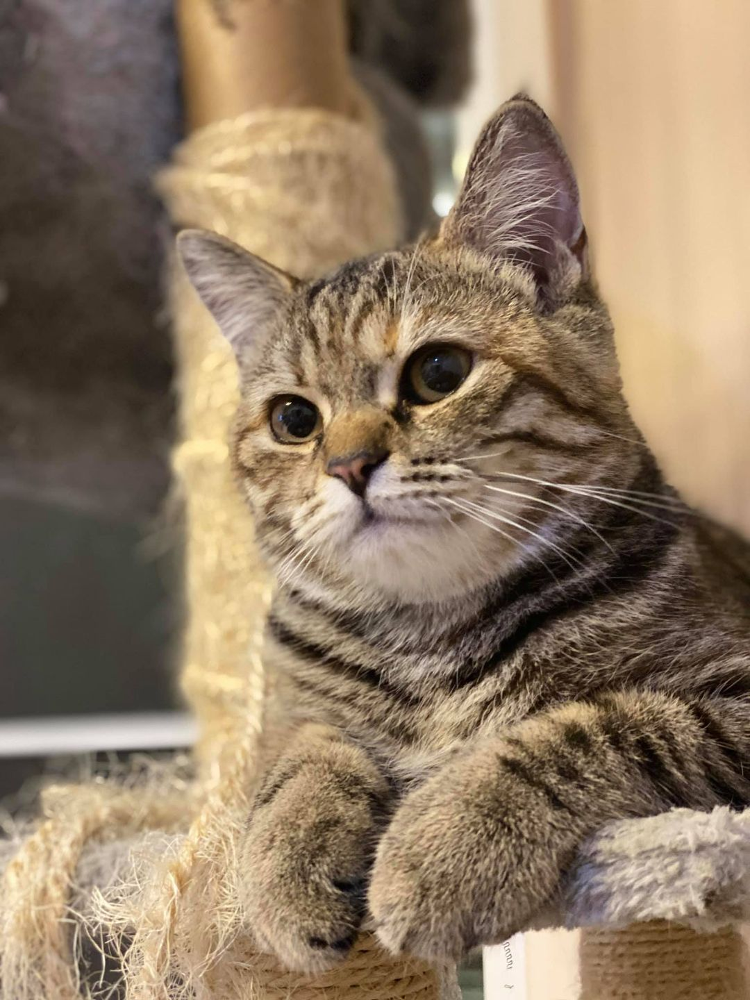

In [14]:
cat = load_img('cat.jpg')
cat

In [15]:
img_array = img_to_array(cat)
img_array.shape

(1440, 1080, 3)



>ขยายมิติของภาพจาก 3 มิติเป็น 4 มิติ เพื่อเตรียมนำเข้า Function ทำ Image Augmentation



In [16]:
# เพิ่มมิติของ Batch (จาก (H, W, C) -> (1, H, W, C))
img_batch = tf.expand_dims(img_array, 0)
img_batch.shape

TensorShape([1, 1440, 1080, 3])



> ทดลองทำ Vertical Shift ด้วยการเลื่อนภาพขึ้นลงแบบสุ่มไม่เกิน 20%



In [17]:
# height_factor=0.2 เลื่อนขึ้น/ลงได้ไม่เกิน 20% ของความสูงภาพ
vertical_shift_layer = tf.keras.layers.RandomTranslation(
    height_factor=0.2,
    width_factor=0.0, # ไม่มีการเลื่อนในแนวนอน
    fill_mode='reflect'
)

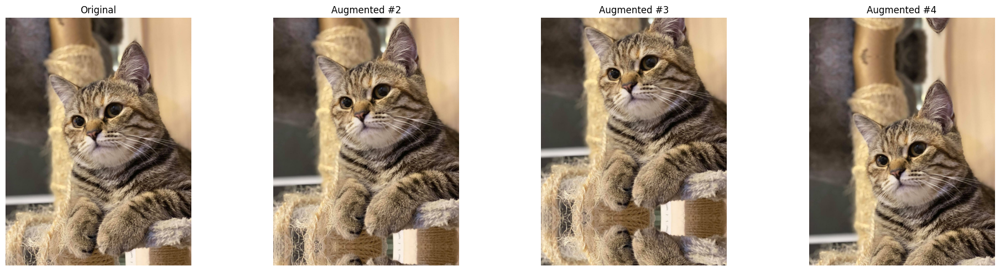

In [18]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

# แสดงภาพที่ผ่าน Augmentation 3 ครั้ง
for i in range(1, 4):
    # ส่งภาพ (ที่เป็น Batch) ผ่าน Layer ที่เราสร้างไว้
    augmented_batch = vertical_shift_layer(img_batch)

    # แปลง Tensor กลับเป็นภาพที่แสดงผลได้ (Numpy array ชนิด uint8)
    # และเลือกภาพแรกจาก Batch (index [0])
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented #{i+1}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()



> ทดลองทำ Horizontal Shift ด้วยการเลื่อนภาพซ้ายขวาแบบสุ่มไม่เกิน 20%



In [19]:
horizontal_shift_layer = tf.keras.layers.RandomTranslation(
    height_factor=0.0, # ไม่มีการเลื่อนในแนวตั้ง
    width_factor=0.2,
    fill_mode='reflect'
)

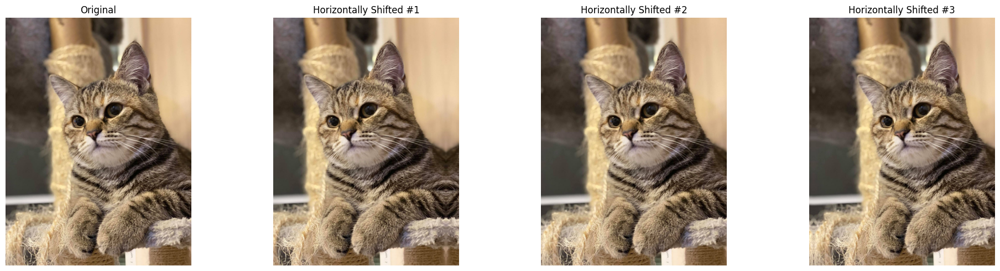

In [20]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = horizontal_shift_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Horizontally Shifted #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()



> ทดลองหมุนภาพ (Rotate) ไม่เกิน 30 องศา แบบสุ่ม


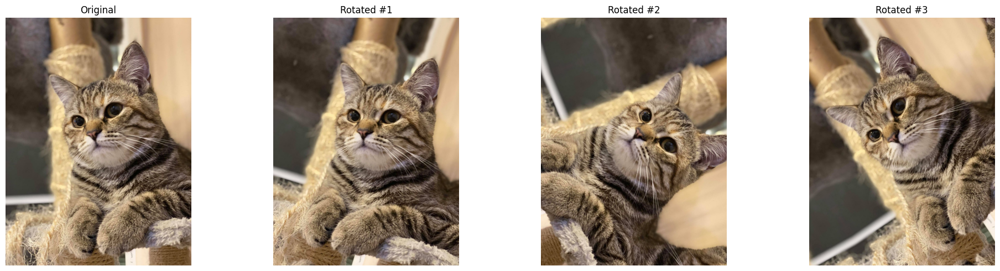

In [21]:
rotation_layer = tf.keras.layers.RandomRotation(
    factor=0.2,  # Randomly rotate by a factor of up to 20% of 360 degrees (72 degrees)
    fill_mode='reflect'
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = rotation_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Rotated #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()



>ทดลองขยายภาพ (Zoom) แบบสุ่มไม่เกิน 30%



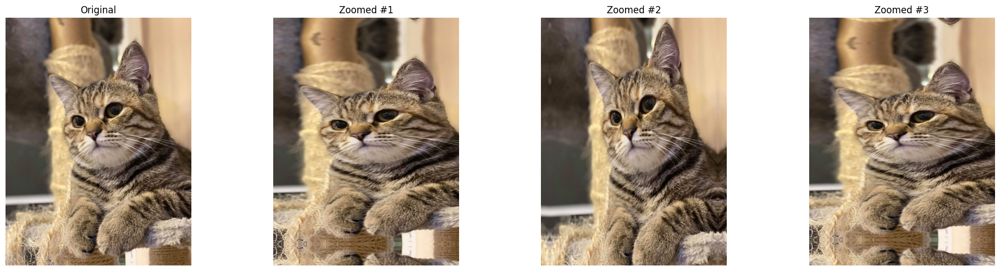

In [22]:
zoom_layer = tf.keras.layers.RandomZoom(
    height_factor=0.3, # Randomly zoom in/out by up to 30% vertically
    width_factor=0.3,  # Randomly zoom in/out by up to 30% horizontally
    fill_mode='reflect'
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = zoom_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Zoomed #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()



> ทดลองพลิกภาพแนวนอน (Horizontal Flip) แบบสุ่ม



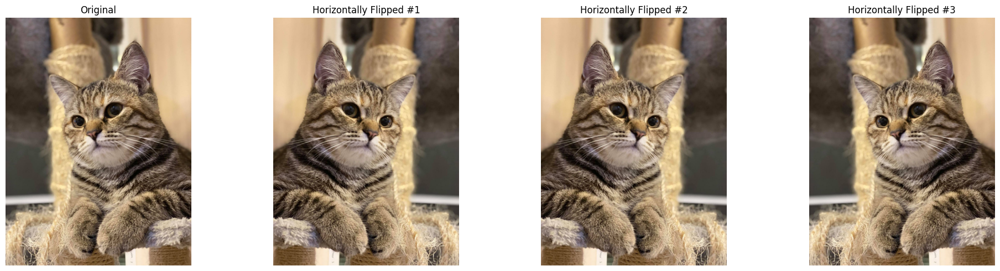

In [23]:
horizontal_flip_layer = tf.keras.layers.RandomFlip(
    mode='horizontal'  # Randomly flip images horizontally
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = horizontal_flip_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Horizontally Flipped #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()



> ทดลองพลิกภาพแนวตั้ง (Vertical Flip) แบบสุ่ม



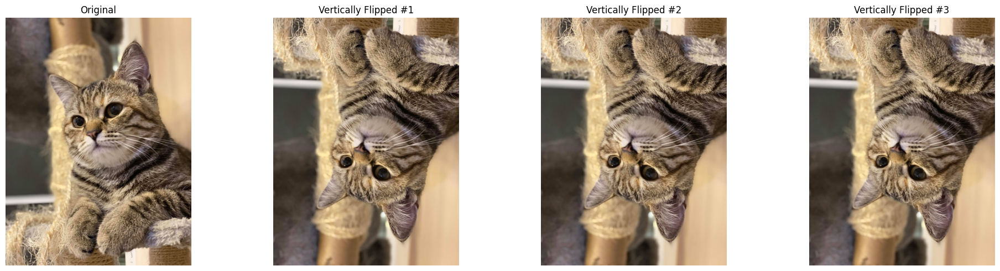

In [24]:
vertical_flip_layer = tf.keras.layers.RandomFlip(
    mode='vertical'  # Randomly flip images vertically
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = vertical_flip_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Vertically Flipped #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

# **Fill Mode**
โดย Default เมื่อมีการเลื่อนภาพ บิดภาพ หมุนภาพ จะเกิดพื้นที่ว่างที่มุม ซึ่งจะมีการเติมภาพให้เต็มโดยใช้เทคนิคแบบต่าง ๆ ดังต่อไปนี้

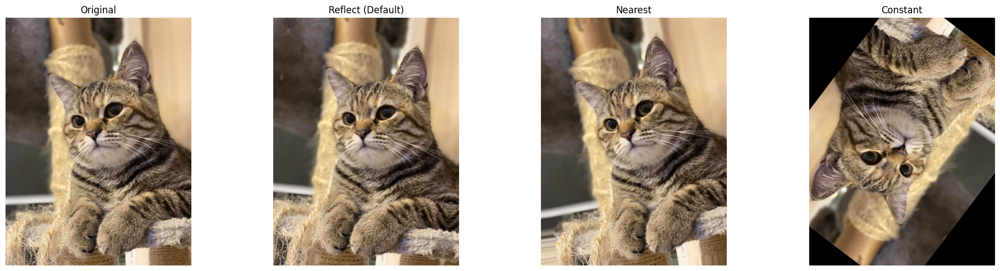

In [25]:
# reflect ค่า Default ของ API
reflect_layer = tf.keras.layers.RandomRotation(factor=0.4, fill_mode='reflect')

nearest_layer = tf.keras.layers.RandomRotation(factor=0.4, fill_mode='nearest')

# 'constant' (เติมด้วยค่าคงที่ ในที่นี้คือสีดำ)
constant_layer = tf.keras.layers.RandomRotation(factor=0.4, fill_mode='constant')

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

# แสดงภาพต้นฉบับ
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

# แสดงภาพที่เติมขอบแบบต่างๆ
titles = ['Reflect (Default)', 'Nearest', 'Constant']
layers = [reflect_layer, nearest_layer, constant_layer]

for i in range(3):
    augmented_batch = layers[i](img_batch, training=True) # training=True เพื่อให้เกิดการสุ่ม
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i+1].imshow(augmented_image)
    ax[i+1].set_title(titles[i])
    ax[i+1].axis('off')

plt.tight_layout()
plt.show()

นอกจากนี้ยังมีการทำ Color Augmentation ได้ด้วย





>ทดลองสุ่มปรับ ความสว่าง ของภาพ ทำให้ภาพดูสว่างขึ้นหรือมืดลงเล็กน้อย



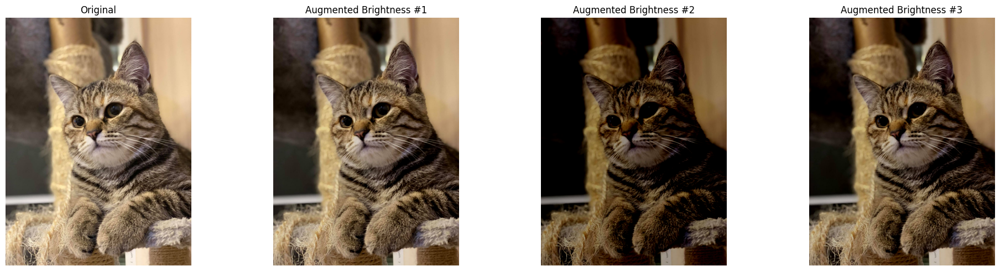

In [26]:
# Layer สำหรับ Random Brightness
brightness_layer = tf.keras.layers.RandomBrightness(factor=0.4)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = brightness_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Brightness #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()



> ทดลองสุ่มปรับ ความต่างสี ทำให้ความแตกต่างระหว่างส่วนที่สว่างและมืดของภาพเปลี่ยนไป



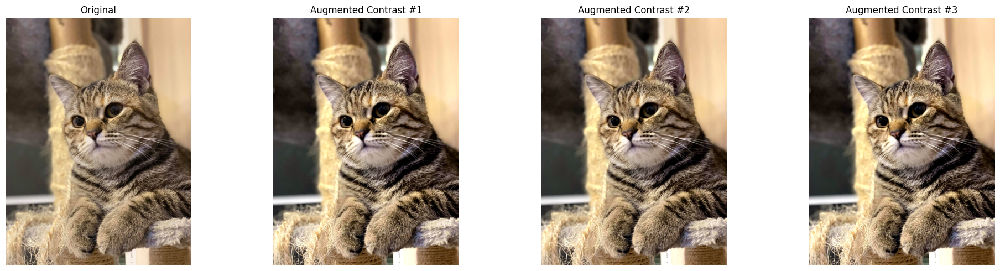

In [27]:
# สร้าง Layer สำหรับ Random Contrast
contrast_layer = tf.keras.layers.RandomContrast(factor=0.4)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = contrast_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Contrast #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()



> ทดลองสุ่มปรับ ความอิ่มตัวของสี ทำให้สีของภาพดูสดขึ้นหรือซีดลง



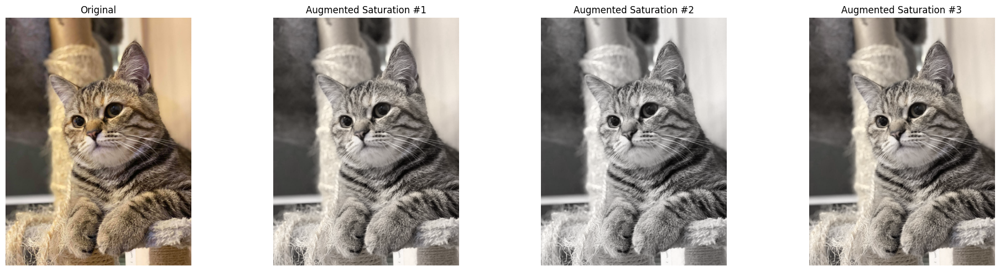

In [28]:
# สร้าง Layer สำหรับ Random Saturation
saturation_layer = tf.keras.layers.RandomSaturation(factor=0.3)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = saturation_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Saturation #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()



> ทดลอง สุ่มปรับ ความอิ่มตัวของสี ทำให้สีของภาพดูสดขึ้นหรือซีดลง



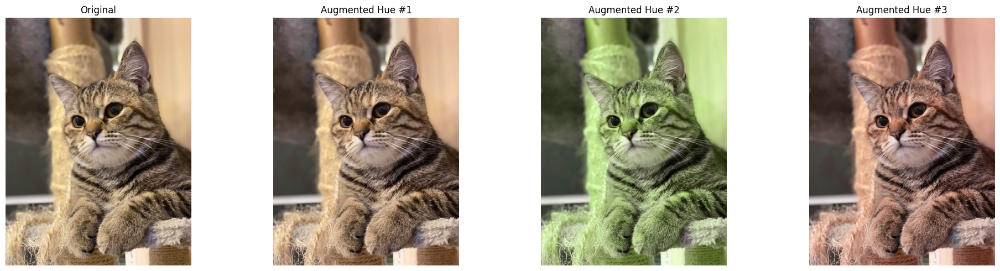

In [29]:
# สร้าง Layer สำหรับ Random Hue
hue_layer = tf.keras.layers.RandomHue(factor=0.3)

# --- Plot ผลลัพธ์ ---
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = hue_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Hue #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

เราจะเพิ่มความหลากหลายของภาพเพื่อแก้ปัญหา Overfitting ตามขั้นตอนดังนี้

> นิยาม Model



In [30]:
input_shape=(32, 32, 3)
inputs = Input(shape=input_shape)

data_augmentation = models.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
    ],
    name="data_augmentation",
)

# นำ Input ไปผ่าน Augmentation Layers ก่อน
x = data_augmentation(inputs)

# Feature Extraction Layers
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)

# Classification Layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)

# กำหนด Output Layer
outputs = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)

# ประกาศว่าโมเดลนี้มีจุดเริ่มต้น (inputs) และจุดสิ้นสุด (outputs)
model = models.Model(inputs=inputs, outputs=outputs)



> Compile Model



In [31]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)



> Train Model



In [32]:
EPOCHS = 120

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.3022 - loss: 1.9131 - val_accuracy: 0.4539 - val_loss: 1.5377
Epoch 2/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4652 - loss: 1.4958 - val_accuracy: 0.5111 - val_loss: 1.4181
Epoch 3/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5095 - loss: 1.3791 - val_accuracy: 0.5680 - val_loss: 1.2362
Epoch 4/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.5376 - loss: 1.2934 - val_accuracy: 0.5903 - val_loss: 1.1828
Epoch 5/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5585 - loss: 1.2450 - val_accuracy: 0.6059 - val_loss: 1.1427
Epoch 6/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5790 - loss: 1.2100 - val_accuracy: 0.6129 - val_loss: 1.1087
Epoch 7/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5854 - loss: 1.1723 - val_accuracy: 0.6231 - val_loss: 1.0929
Epoch 8/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5989 - loss: 1.1437 - val_acc



> Plot กราฟ



In [33]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()





> Evaluation





In [34]:
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"\nTest accuracy = {test_acc}")

313/313 - 1s - 4ms/step - accuracy: 0.7173 - loss: 0.9015

Test accuracy = 0.7172999978065491


จากกราฟ Loss ด้านบน พบว่า Validation Loss ไม่พุ่งขึ้นในรอบแรกๆ เหมือนในการ Train แบบไม่ใช้เทคนิค Image Augmentation

# **Dropout**

Dropout เป็นเทคนิคในการทำ Regularization ที่เรียบง่าย แต่มีประสิทธิภาพอย่างมาก โดยเมื่อมีการใช้งาน Dropout ภายใน Layer ที่กำหนดแล้ว Node ใน Layer นั้นจะถูกสุ่มเพื่อปิดการทำงานชั่วคราวในแต่ละรอบของการทำ Forward Propagation และ Back-propagation ตามอัตราที่กำหนด ในขณะที่มีการ Train Model ทำให้ไม่มีการ Update Weight ใดๆ ที่ถูกเชื่อมต่อกับ Neuron Node ที่กำลังถูกปิด



เราอาจมอง Dropout เหมือนกับการทำงานของบริษัทหนึ่งที่มีพนักงาน 100 คน ครับ



ในกรณีที่ไม่มีการใช้ Dropout เปรียบได้กับการที่บริษัทมีนโยบายไม่อนุญาตให้พนักงานคนใดเลยลาหยุดงาน ทำให้แต่ละคนต้องรับผิดชอบงานของตัวเองจนมีความเชี่ยวชาญเฉพาะด้าน สามารถแก้ปัญหาแบบเดิม ๆ ที่เคยเรียนรู้มาแล้วเป็นอย่างดี แต่เมื่อเจอปัญหาใหม่ ๆ พวกเขาจะไม่สามารถประยุกต์ใช้ความรู้และทักษะความชำนาญเดิมมาแก้ปัญหาได้อย่างมีประสิทธิภาพ



ในกรณีที่มีการใช้ Dropout เปรียบได้กับการที่บริษัทมีนโยบายอนุญาตให้พนักงานสามารถลาหยุดงาน ด้วยการสุ่มในอัตราที่กำหนด เช่น วันละ 1 คน โดยคนที่ยังคงปฏิบัติงานต้องสลับกันมารับผิดชอบในหน้าที่ของพนักงานที่ได้หยุดพัก จนทำให้ทุกคนสามารถทำงานต่างๆ ทดแทนกันได้อย่างดี โดยไม่มีพนักงานคนใดมีอิทธิพลเหนือคนอื่น เมื่อเจอปัญหาใหม่ๆ พวกเขาจะสามารถประยุกต์ใช้ความรู้และทักษะความชำนาญมาแก้ปัญหาได้อย่างมีประสิทธิภาพ



เราจะทดลองใช้เทคนิค Dropout ร่วมกับ Image Augmentation เพื่อแก้ปัญหา Overfitting ตามขั้นตอนดังต่อไปนี้



> นิยาม Model



In [35]:
input_shape = (32, 32, 3)

data_augmentation = models.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
    ],
    name="data_augmentation",
)

inputs = Input(shape=input_shape)
x = data_augmentation(inputs)

# Feature Extraction Layers
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)

# Classification Layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)

# ตำแหน่งที่เพิ่ม Dropout
x = tf.keras.layers.Dropout(0.2)(x)

outputs = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = models.Model(inputs=inputs, outputs=outputs)



> Compile Model




In [36]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [37]:
EPOCHS = 120

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.2659 - loss: 1.9884 - val_accuracy: 0.4518 - val_loss: 1.4987
Epoch 2/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4179 - loss: 1.5978 - val_accuracy: 0.5034 - val_loss: 1.4003
Epoch 3/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4689 - loss: 1.4809 - val_accuracy: 0.5296 - val_loss: 1.3094
Epoch 4/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4943 - loss: 1.4000 - val_accuracy: 0.5680 - val_loss: 1.2147
Epoch 5/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5208 - loss: 1.3437 - val_accuracy: 0.5701 - val_loss: 1.2318
Epoch 6/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5321 - loss: 1.3157 - val_accuracy: 0.6105 - val_loss: 1.1005
Epoch 7/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5452 - loss: 1.2739 - val_accuracy: 0.6170 - val_loss: 1.0863
Epoch 8/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5576 - loss: 1.2544 - val_acc

In [38]:
cc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

In [39]:
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"\nTest accuracy = {test_acc}")

313/313 - 2s - 5ms/step - accuracy: 0.7013 - loss: 0.9007

Test accuracy = 0.7013000249862671


Label Smoothing

โดยปกติแล้ว Label แบบ One-hot จะมีความมั่นใจ 100% ว่า Class ไหนเป็น Class ที่ถูกต้อง เช่น [0, 0, 1, 0, 0] เรา Label ว่าเป็น Class ที่ 2 แน่นอน 100%
Label Smoothing จะเปลี่ยน Label นั้นให้มีความนุ่มนวลขึ้น โดยแบ่งความน่าจะเป็นไปให้ Class อื่นเล็กน้อย เช่น แบ่งไป 0.1 หรือ 10% จากเดิม [0, 0, 1, 0, 0] แบ่งเป็น [0.011, 0.011, 0.911, 0.011, 0.011] โดยยังคงมั่นใจว่าเป็นคลาสที่ 2 แต่ก็เผื่อใจว่าอาจเป็นคลาสอื่นได้บ้าง

การทำแบบนี้จะป้องกันไม่ให้โมเดลสร้างค่า Logits ที่สูงเกินไปสำหรับคำตอบที่ถูกต้อง ซึ่งช่วยลด Overfitting และทำให้โมเดลมีประสิทธิภาพกับข้อมูลที่ไม่เคยเห็นดีขึ้น
ค่า Logits คือ Raw output ที่ได้จาก Layer สุดท้ายของ Neural Network ก่อนที่จะถูกแปลงเป็นค่าความน่าจะเป็น (Probability) ด้วยฟังก์ชันอย่าง Softmax
Model คำนวณ Logits หลังจากข้อมูลภาพผ่าน Layer ต่าง ๆ มาแล้ว โดย Layer สุดท้ายจะให้ผลลัพธ์ดิบออกมาสำหรับแต่ละ Class เช่น

สุนัข 2.0
แมว 1.0
นก 0.1

จากค่า Logits นี้ เราจะเห็นว่า Model มีความเชื่อมั่นใน สุนัข มากที่สุด (คะแนนสูงสุด) และเชื่อมั่นใน นก น้อยที่สุด
ฟังก์ชัน Softmax จะรับค่า Logits เหล่านี้ไปแปลงให้อยู่ในรูปของความน่าจะเป็น ทำให้แต่ละค่าจะอยู่ระหว่าง 0 ถึง 1 ผลรวมของทุกค่าจะเท่ากับ 1 หรือ 100% เช่น

สุนัข 0.7 (70%)
แมว 0.2 (20%)
นก 0.1 (10%)

ในทางปฏิบัติ Loss Function อย่าง CategoricalCrossentropy ใน TensorFlow/Keras มักจะทำงานกับ Logits โดยตรง แทนที่จะทำงานกับค่า Probability ที่ผ่าน Softmax มาแล้ว เพราะการคำนวณทางคณิตศาสตร์จะมีความเสถียร (numerically stable) และประสิทธิภาพสูงกว่า เราจึงต้องสนใจ Logits โดยการปรับให้มีความนุ่มนวลขึ้น

นิยาม Model

In [40]:
input_shape = (32, 32, 3)

data_augmentation = models.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
    ],
    name="data_augmentation",
)

inputs = Input(shape=input_shape)
x = data_augmentation(inputs)

x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)

x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)
model = models.Model(inputs=inputs, outputs=outputs)

Compile Model

In [41]:
# สร้าง Loss Function object พร้อมกำหนดค่า Label Smoothing
loss_function = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1)

model.compile(optimizer='adam', loss=loss_function, metrics=['accuracy'])

model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [42]:
EPOCHS = 120

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.2541 - loss: 2.0687 - val_accuracy: 0.4643 - val_loss: 1.6844
Epoch 2/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4279 - loss: 1.7472 - val_accuracy: 0.5116 - val_loss: 1.5869
Epoch 3/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4630 - loss: 1.6704 - val_accuracy: 0.5455 - val_loss: 1.5007
Epoch 4/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4932 - loss: 1.6184 - val_accuracy: 0.5835 - val_loss: 1.4541
Epoch 5/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5164 - loss: 1.5729 - val_accuracy: 0.5746 - val_loss: 1.4569
Epoch 6/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5258 - loss: 1.5472 - val_accuracy: 0.5950 - val_loss: 1.4052
Epoch 7/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5409 - loss: 1.5256 - val_accuracy: 0.5940 - val_loss: 1.4032
Epoch 8/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5525 - loss: 1.5090 - val_accu

Plot กราฟ

In [43]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

# **วัดค่า Accuracy จาก Test Dataset**


In [44]:
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"\nTest accuracy = {test_acc}")

313/313 - 2s - 5ms/step - accuracy: 0.7222 - loss: 1.1690

Test accuracy = 0.7221999764442444
